In [1]:
from all_imports import *
import _modules 

from _modules.plotColors import *

import datetime as dt

 ### test init### 


## With Manual checked Thermal WalkData

In [2]:
import pandas as pd

# man_comb_df = pd.read_csv(
#     r"C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\data\processed\cozieMeasureDf_validation.csv",
#     parse_dates=['time_slice'],
#     dayfirst=False
# )

man_comb_df = pd.read_csv(
    r"C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\src\cozieMeasureDf.csv",
    parse_dates=['time_slice'],
    dayfirst=False
)



man_comb_df['index_time'] = man_comb_df['time_slice'].dt.tz_localize('Asia/Singapore')

# Move 'index_time' to the front and drop 'time_slice'
man_comb_df = man_comb_df.drop(columns=['time_slice'])
man_comb_df = man_comb_df[['index_time'] + [col for col in man_comb_df.columns if col != 'index_time']]

# Convert only numeric columns
numeric_cols = man_comb_df.select_dtypes(include='number').columns
man_comb_df[numeric_cols] = man_comb_df[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Count non-NaN values for each column
non_nan_counts = man_comb_df.notna().sum()

# Convert the Series to a DataFrame
non_nan_counts_df = non_nan_counts.reset_index()
non_nan_counts_df.columns = ['Column', 'Non-NaN Count']

# Display the resulting DataFrame
display(non_nan_counts_df)

C:\Users\gottk\AppData\Local\Temp\ipykernel_5696\1641448062.py:9: DtypeWarning: Columns (7,9,11,15,23) have mixed types. Specify dtype option on import or set low_memory=False.
  man_comb_df = pd.read_csv(


,Column,Non-NaN Count
0,index_time,38216
1,Unnamed: 0,38216
2,id_participant,38216
3,q_clothing_color,232
4,q_clothing_insulation,232
...,...,...
58,Radiation_time_difference,11595
59,Humidity,11595
60,Humidity_time_difference,11595
61,WindSpeed,11595


In [3]:
Wst_df = man_comb_df.copy()
Wst_df = Wst_df[Wst_df['Wst_Temperature_C'].notna()]
#display(Wst_df)

Int_df = man_comb_df.copy()
#display(Int_df)

def add_nearest_wst_data(Int_df, Wst_df):
    # Initialize new columns
    new_columns = [
        'Nearest_Wst_Windspeed_ms',
        'Nearest_Wst_Winddirection_deg',
        'Nearest_Wst_Temperature_C',
        'Nearest_Wst_Relativehumidity_p',
        'Nearest_Wst_Dewpoint_C',
        'Nearest_Wst_Solar_radiation_Wm',
        'time_difference'
    ]
    
    for col in new_columns:
        Int_df[col] = np.nan
    
    for i, row in Int_df.iterrows():
        if not pd.isna(row['c_longitude']):
            target_time = row['index_time']
            
            # Find the closest time in Wst_df
            closest_index = Wst_df['index_time'].sub(target_time).abs().idxmin()
            closest_time = Wst_df.loc[closest_index, 'index_time']
            
            # Get the corresponding values and time_difference
            wst_data = Wst_df.loc[closest_index, [
                'Wst_Windspeed_ms',
                'Wst_Winddirection_deg',
                'Wst_Temperature_C',
                'Wst_Relativehumidity_p',
                'Wst_Dewpoint_C',
                'Wst_Solar radiation_Wm'
            ]]
            time_diff = abs((closest_time - target_time).total_seconds())
            
            # Assign the values to the new columns
            Int_df.at[i, 'Nearest_Wst_Windspeed_ms'] = wst_data['Wst_Windspeed_ms']
            Int_df.at[i, 'Nearest_Wst_Winddirection_deg'] = wst_data['Wst_Winddirection_deg']
            Int_df.at[i, 'Nearest_Wst_Temperature_C'] = wst_data['Wst_Temperature_C']
            Int_df.at[i, 'Nearest_Wst_Relativehumidity_p'] = wst_data['Wst_Relativehumidity_p']
            Int_df.at[i, 'Nearest_Wst_Dewpoint_C'] = wst_data['Wst_Dewpoint_C']
            Int_df.at[i, 'Nearest_Wst_Solar_radiation_Wm'] = wst_data['Wst_Solar radiation_Wm']
            Int_df.at[i, 'time_difference'] = time_diff
    
    return Int_df

# Usage
Int_df = add_nearest_wst_data(Int_df, Wst_df)



In [ ]:
display(Int_df)
Int_df.to_csv('test.csv')

2024-01-19 10:13:53+08:00, 2024-01-19 10:42:24+08:00


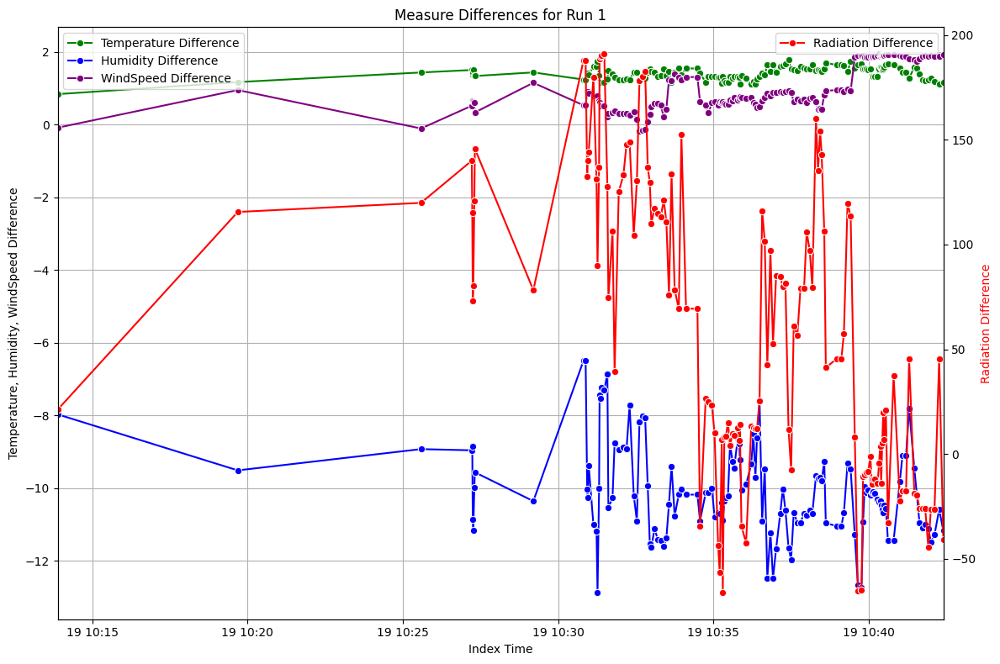

2024-01-25 14:37:42+08:00, 2024-01-25 15:11:01+08:00


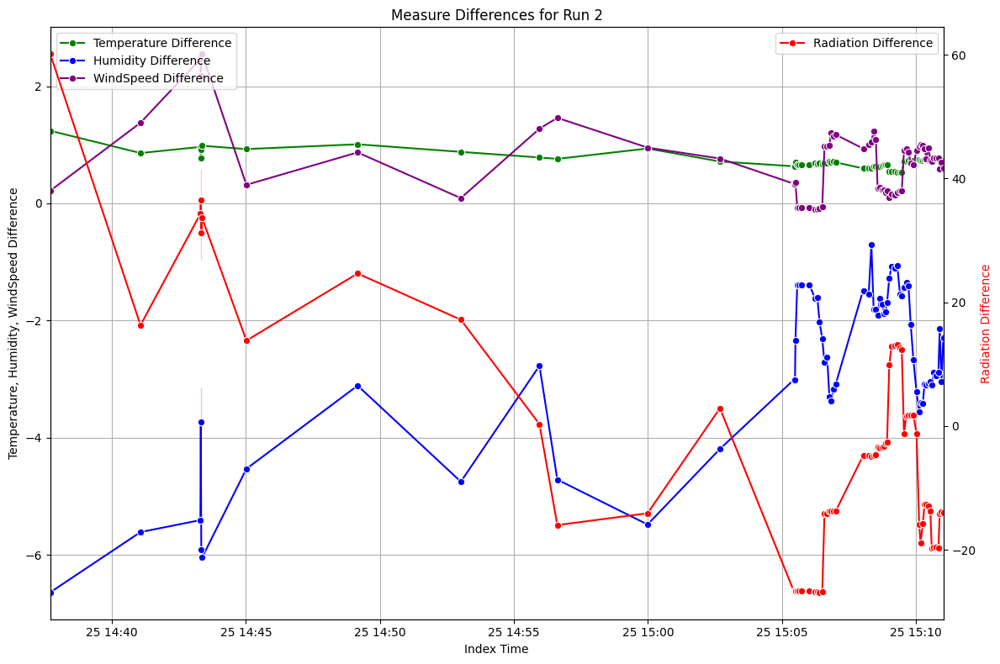

2024-01-31 17:18:00+08:00, 2024-01-31 18:02:27+08:00


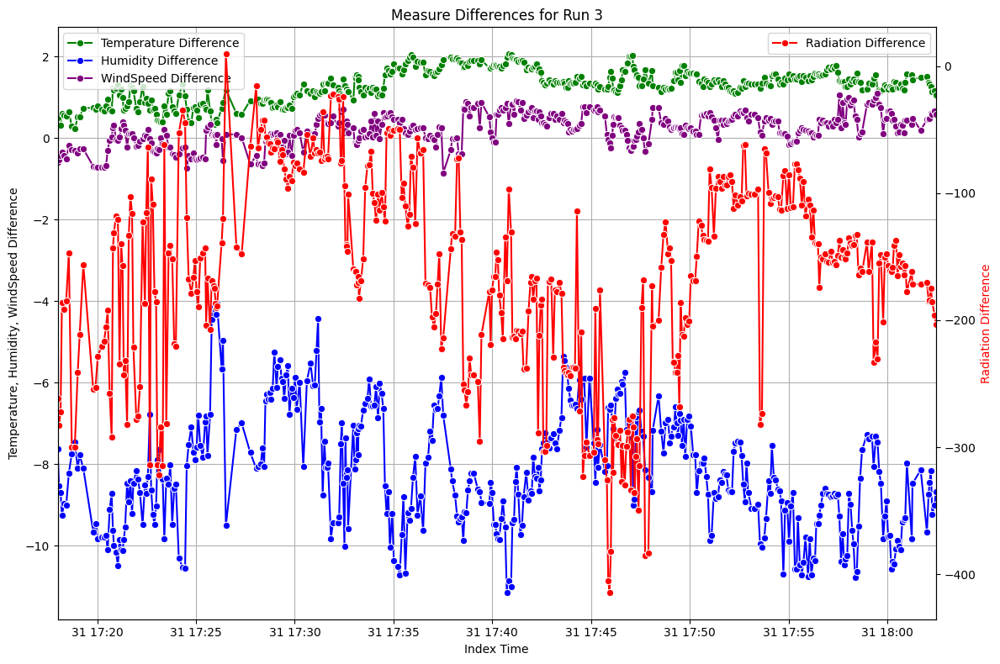

2024-02-11 16:11:10+08:00, 2024-02-11 17:27:28+08:00


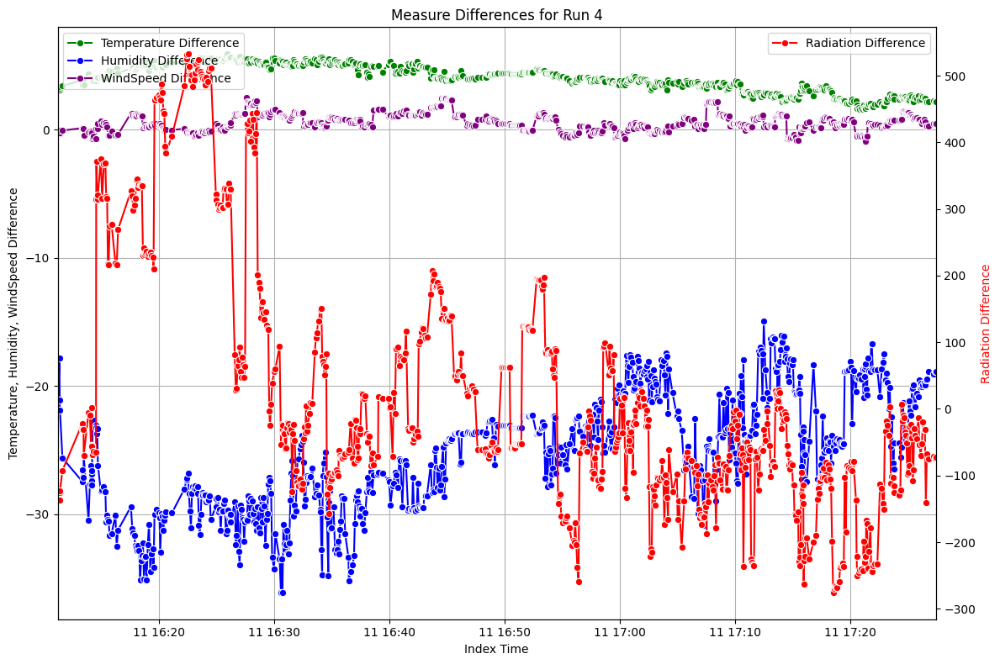

2024-02-15 10:51:40+08:00, 2024-02-15 11:44:25+08:00


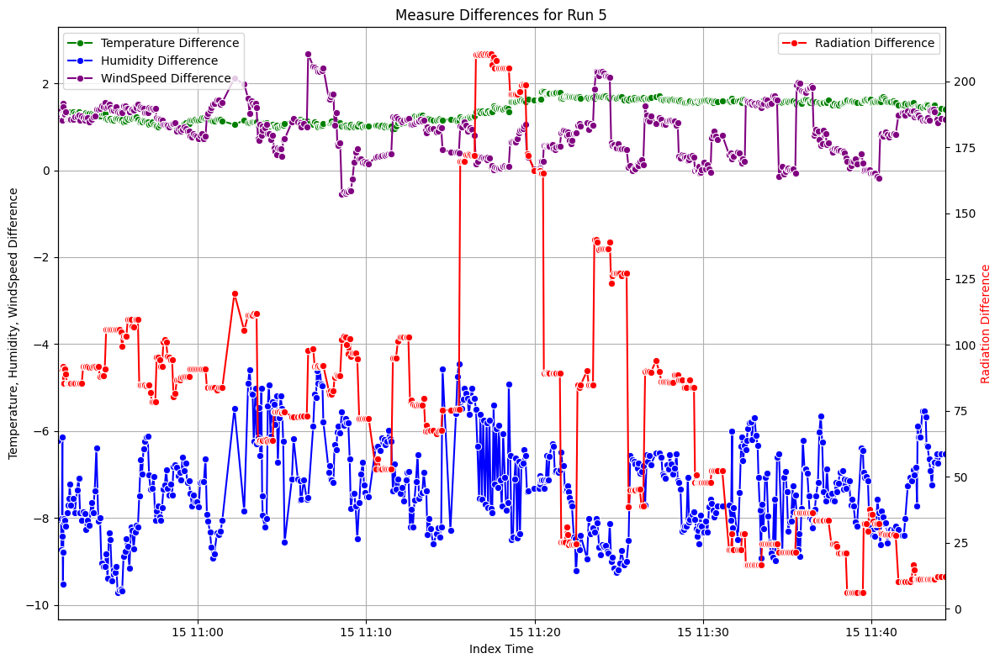

2024-02-21 16:10:35+08:00, 2024-02-21 16:48:22+08:00


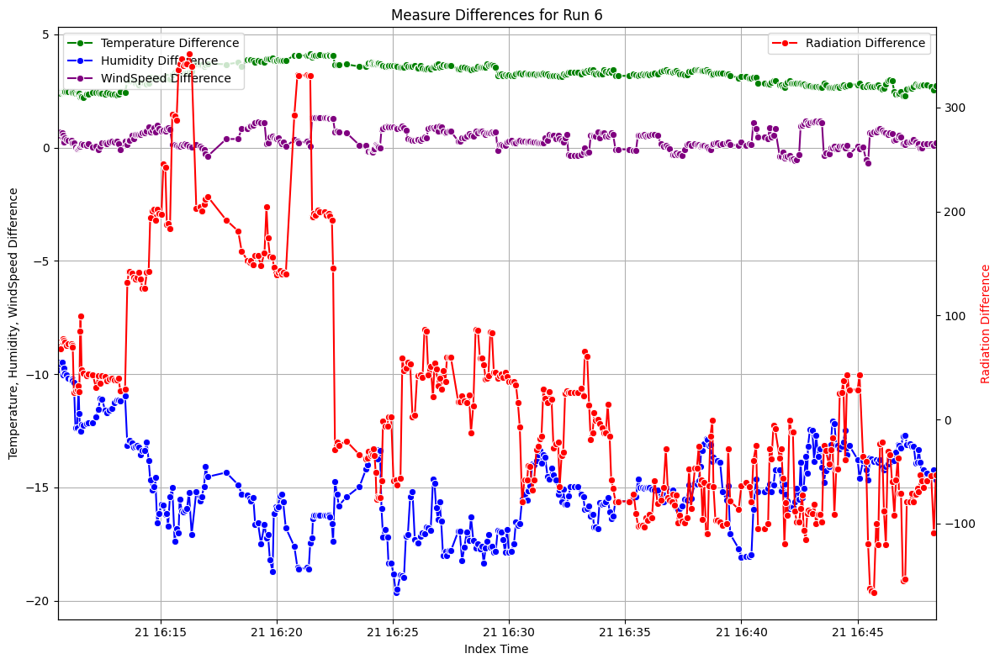

2024-03-11 13:53:15+08:00, 2024-03-11 14:51:27+08:00


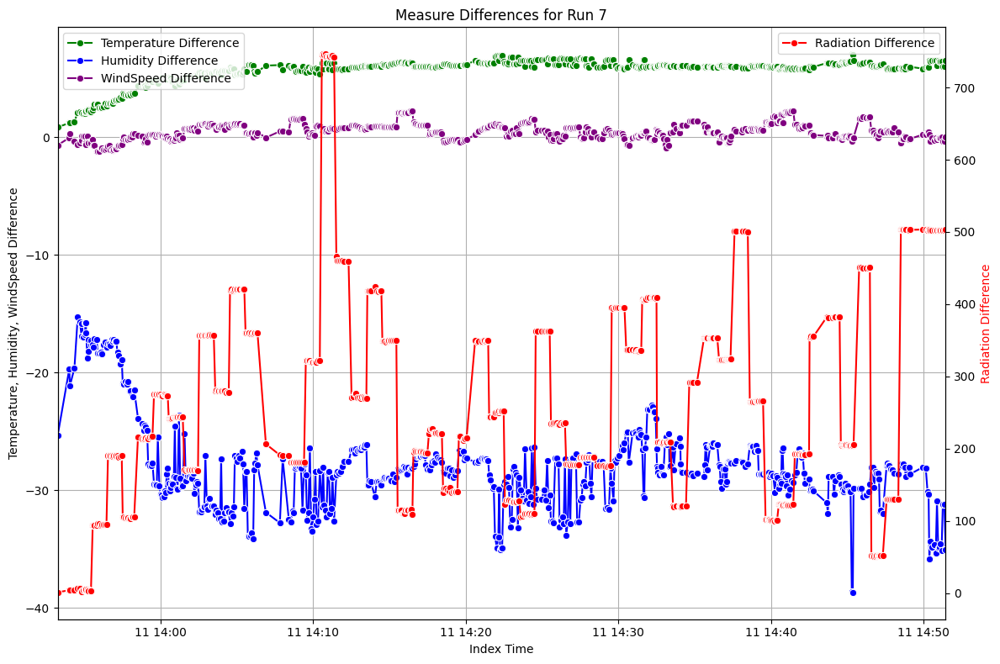

2024-03-13 12:15:24+08:00, 2024-03-13 13:08:26+08:00


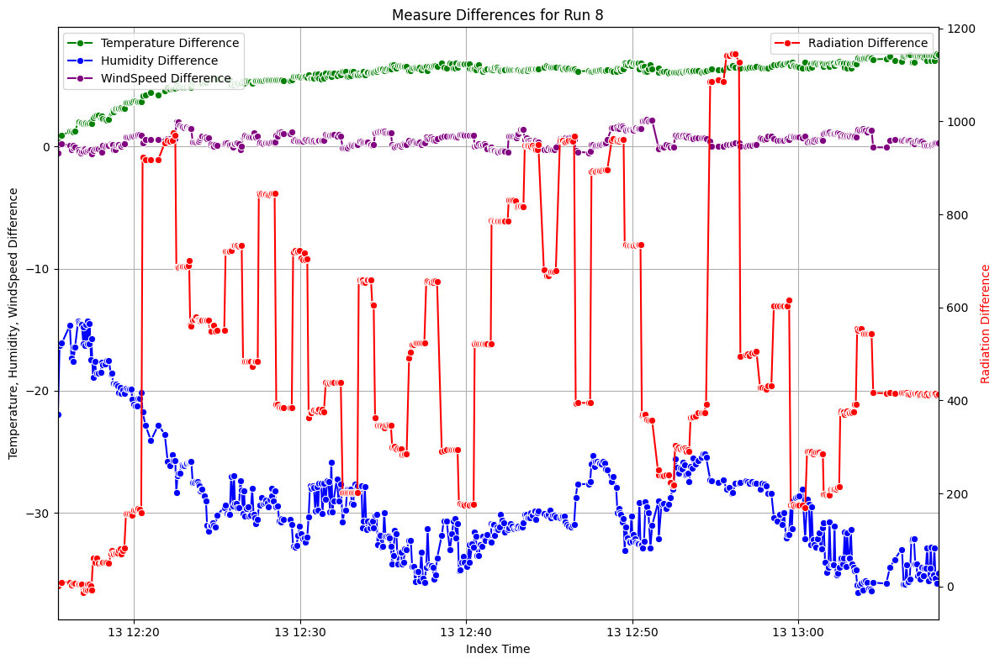

2024-03-14 15:51:01+08:00, 2024-03-14 16:45:26+08:00


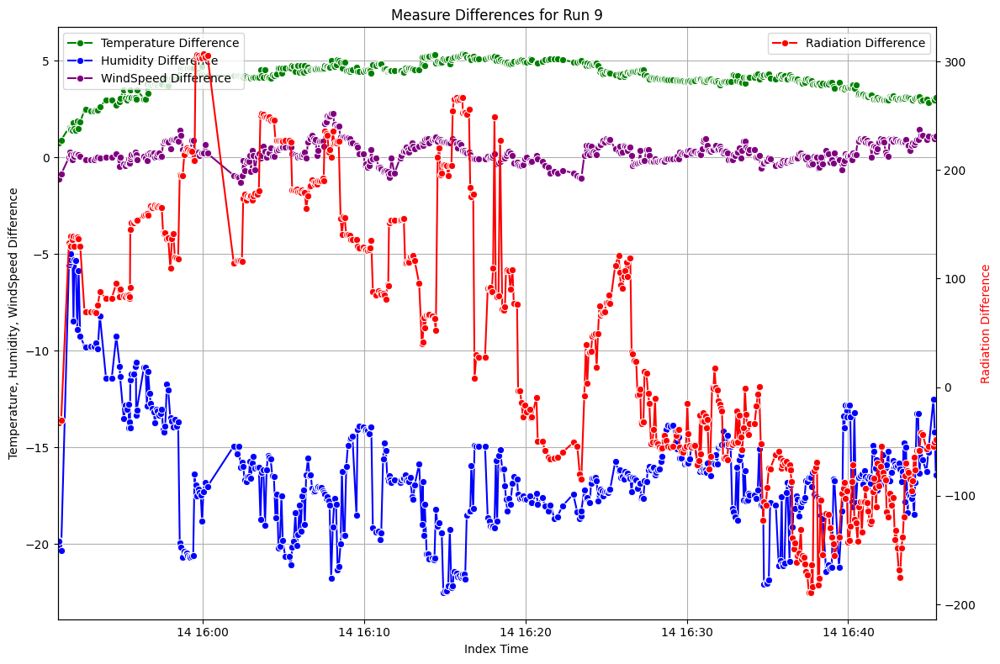

2024-03-19 13:39:57+08:00, 2024-03-19 14:35:28+08:00


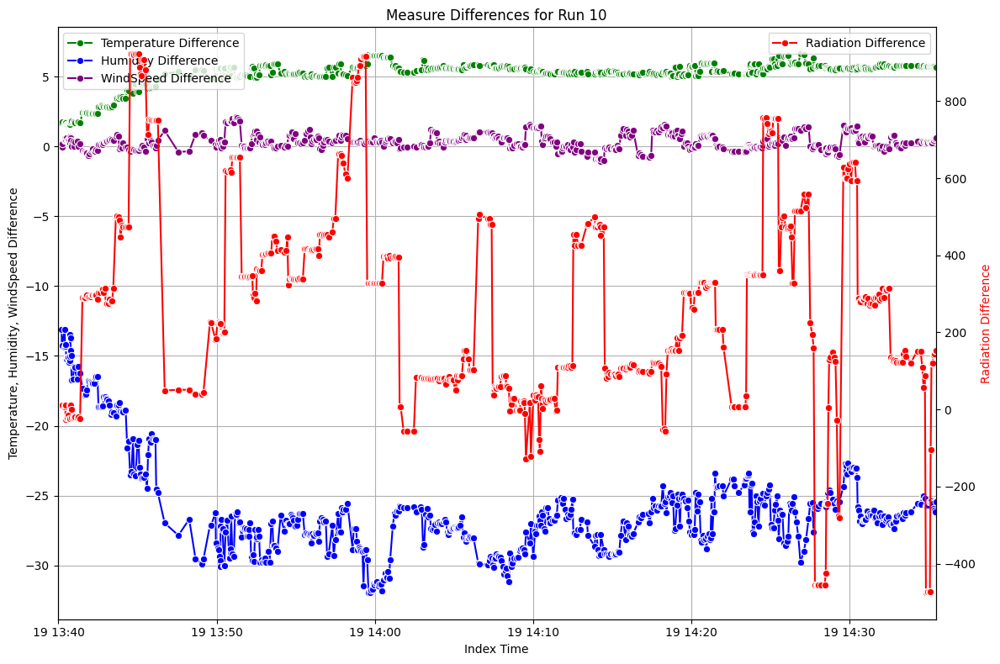

2024-03-20 09:42:53+08:00, 2024-03-20 10:55:30+08:00


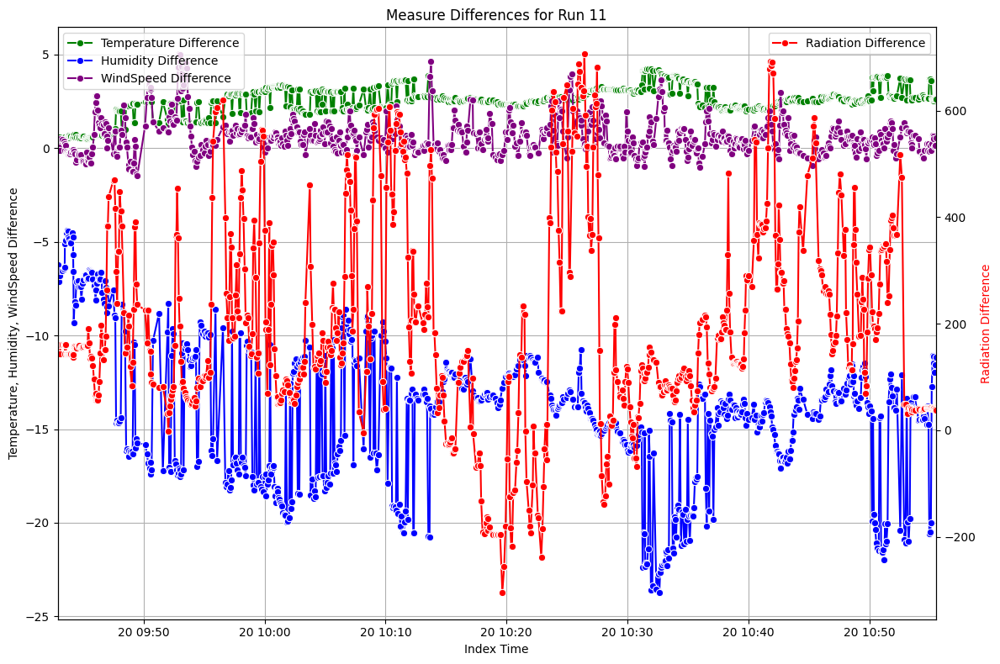

2024-03-21 16:34:32+08:00, 2024-03-21 17:24:24+08:00


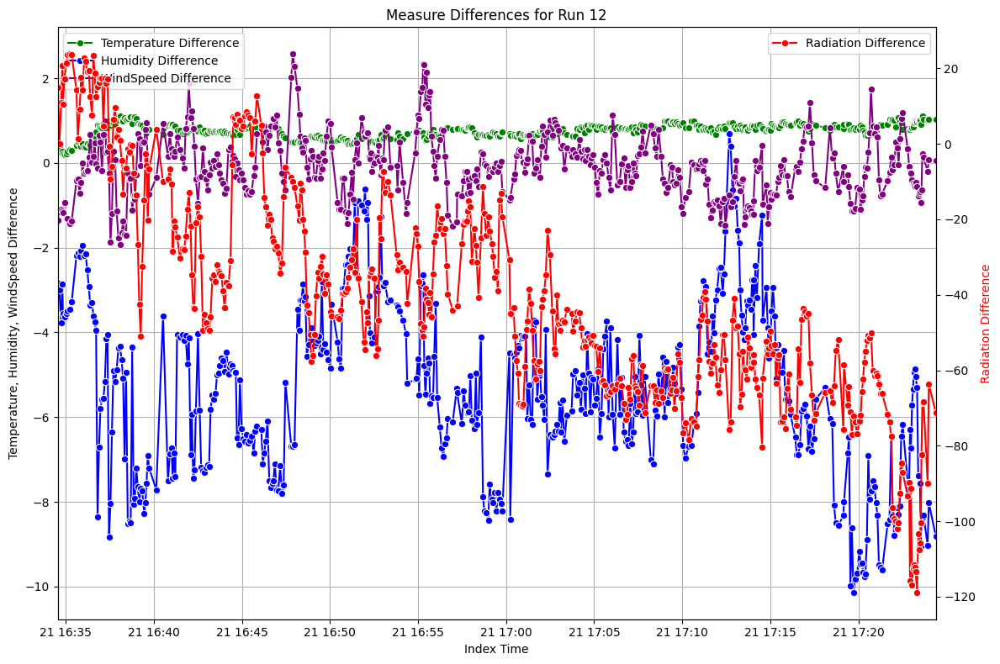

2024-03-22 10:48:00+08:00, 2024-03-22 11:34:22+08:00


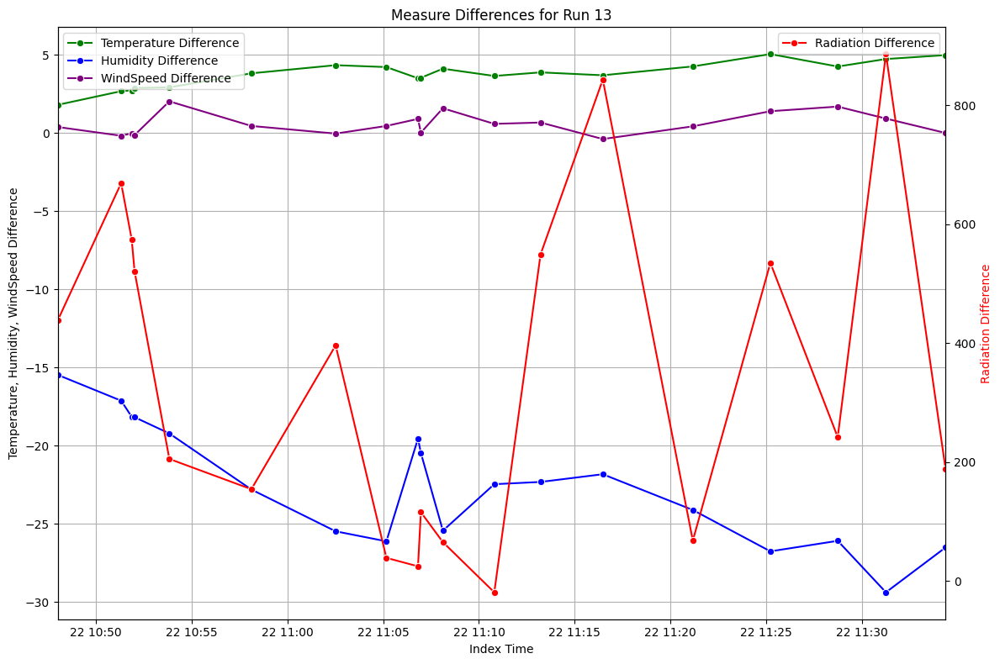

2024-03-23 12:01:02+08:00, 2024-03-23 12:44:07+08:00


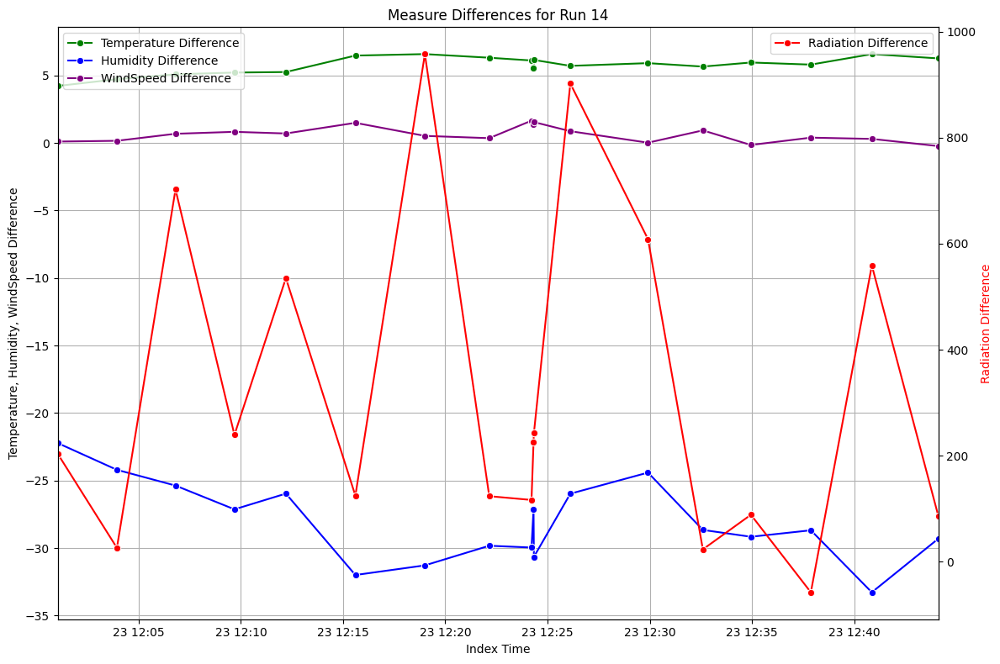

2024-04-02 17:45:57+08:00, 2024-04-02 19:04:07+08:00


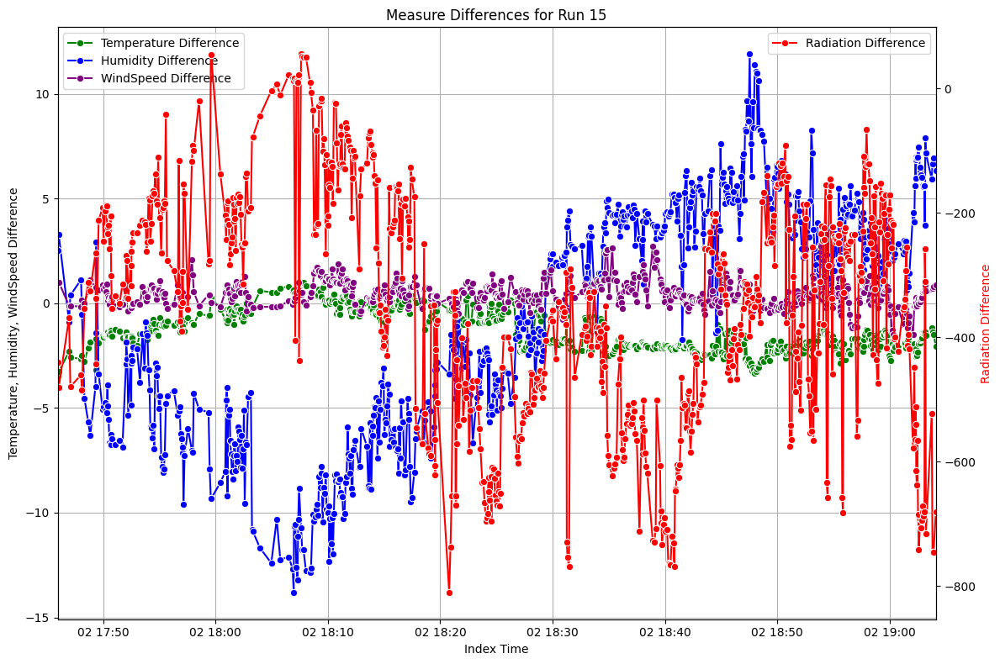

2024-04-05 16:52:10+08:00, 2024-04-05 18:22:18+08:00


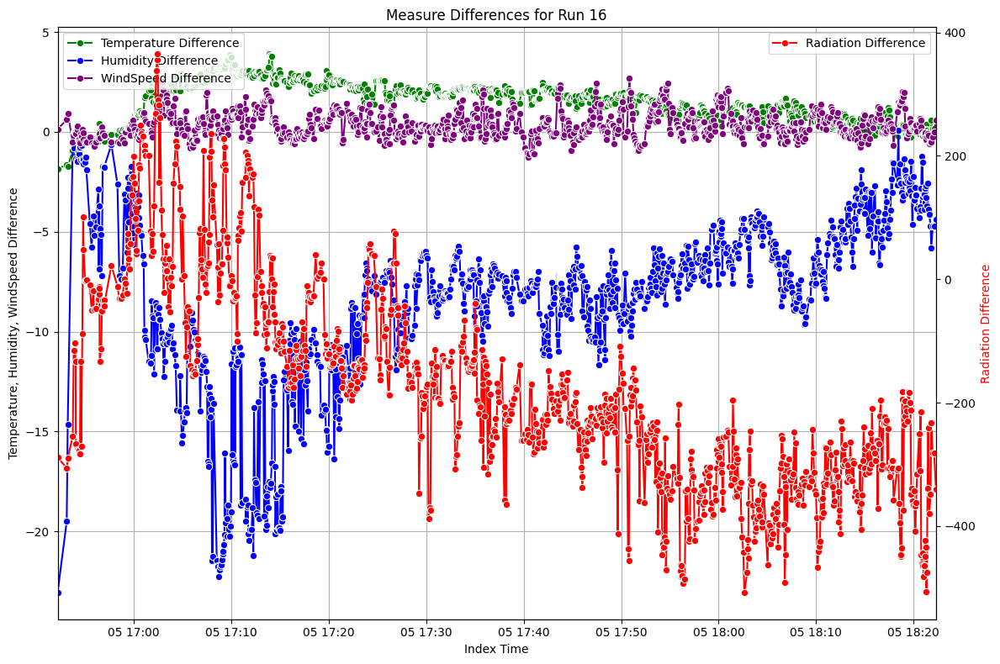

2024-04-06 15:30:34+08:00, 2024-04-06 16:48:25+08:00


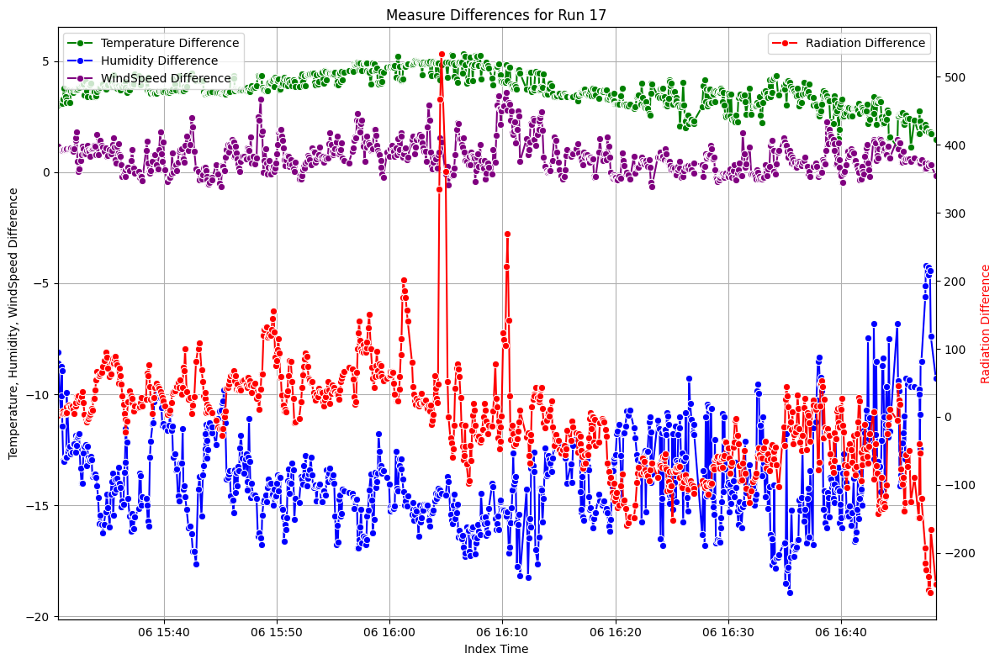

2024-04-07 10:09:12+08:00, 2024-04-07 11:12:47+08:00


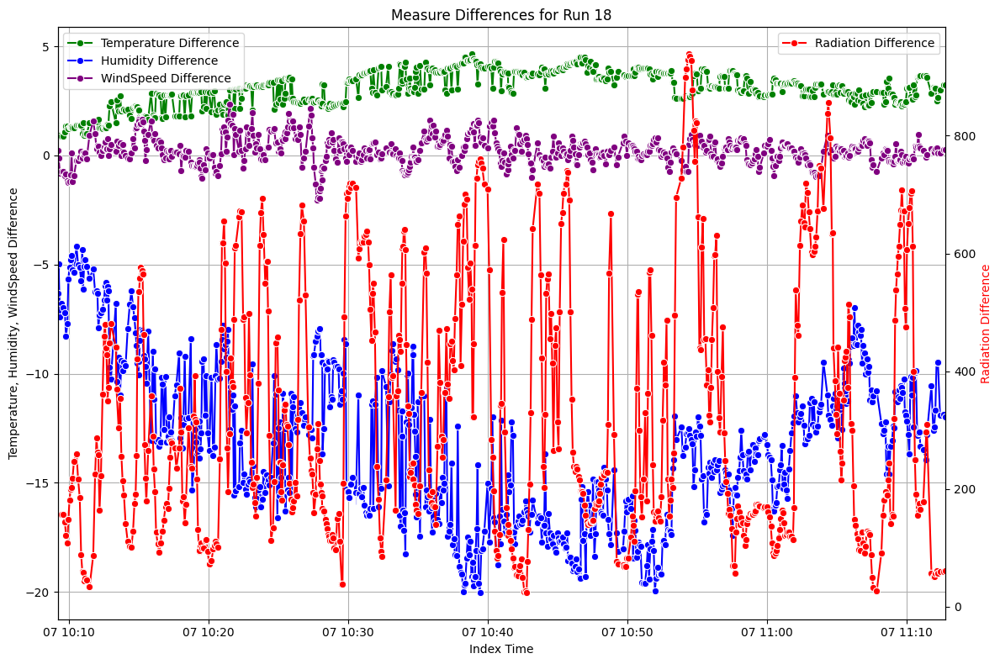

2024-04-07 13:17:04+08:00, 2024-04-07 14:48:51+08:00


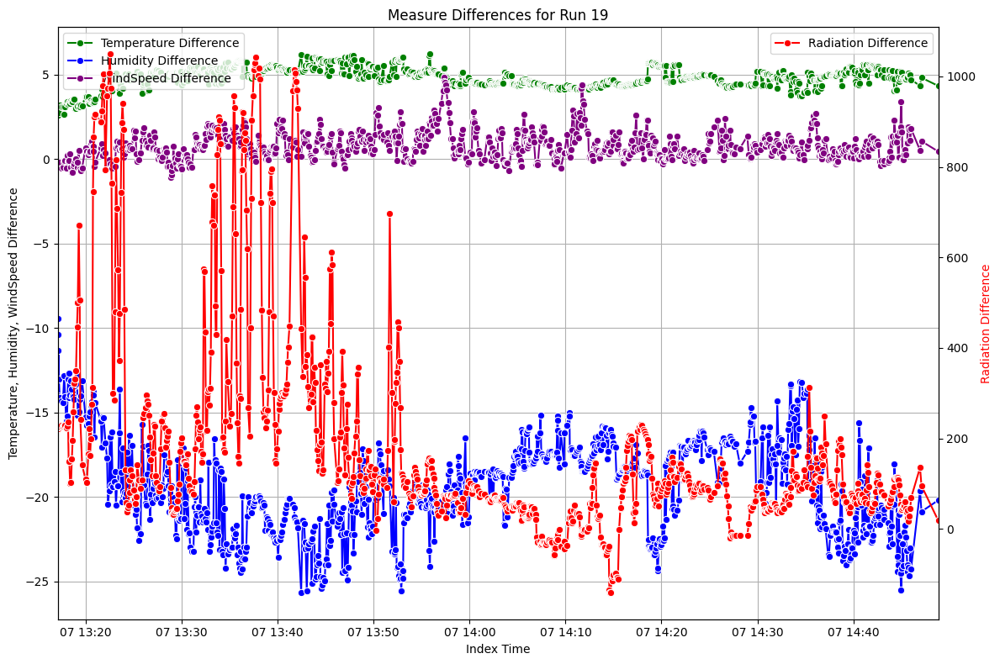

2024-04-08 11:02:58+08:00, 2024-04-08 12:09:00+08:00


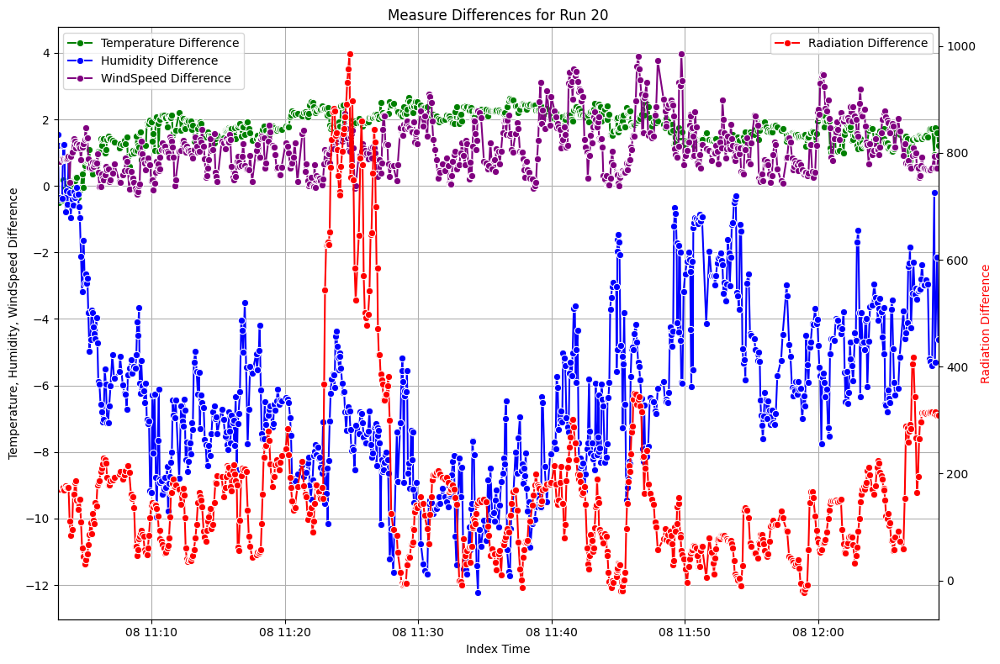

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_measure_differences_by_run(Int_df):
    unique_runs = Int_df['run_number'].unique()
    
    for run_number in unique_runs:
        df_run = Int_df[Int_df['run_number'] == run_number].copy()
        df_run = Int_df[(Int_df['run_number'] == run_number) & (Int_df['time_difference'] < 150)].copy()



        # Calculate differences for each measure
        df_run['Temperature_Difference'] = df_run['Nearest_Wst_Temperature_C'] - df_run['AirTemperature']
        df_run['Humidity_Difference'] = df_run['Nearest_Wst_Relativehumidity_p'] - df_run['Humidity']
        df_run['Radiation_Difference'] = df_run['Nearest_Wst_Solar_radiation_Wm'] - df_run['Radiation']
        df_run['WindSpeed_Difference'] = df_run['Nearest_Wst_Windspeed_ms'] - df_run['WindSpeed']
        
        # Print min and max times for debugging
        min_time = df_run['index_time'].min()
        max_time = df_run['index_time'].max()
        print(f"{min_time}, {max_time}")
        
        # Create a new figure for each run_number
        fig, ax1 = plt.subplots(figsize=(12, 8))
        
        # Plot Temperature, Humidity, and WindSpeed on the primary y-axis
        sns.lineplot(x=df_run['index_time'], y=df_run['Temperature_Difference'], label='Temperature Difference', color='green', marker='o', ax=ax1)
        sns.lineplot(x=df_run['index_time'], y=df_run['Humidity_Difference'], label='Humidity Difference', color='blue', marker='o', ax=ax1)
        sns.lineplot(x=df_run['index_time'], y=df_run['WindSpeed_Difference'], label='WindSpeed Difference', color='purple', marker='o', ax=ax1)
        
        # Create a secondary y-axis for Radiation
        ax2 = ax1.twinx()
        sns.lineplot(x=df_run['index_time'], y=df_run['Radiation_Difference'], label='Radiation Difference', color='red', marker='o', ax=ax2)
        
        # Customize the plot
        ax1.set_xlabel('Index Time')
        ax1.set_ylabel('Temperature, Humidity, WindSpeed Difference', color='black')
        ax2.set_ylabel('Radiation Difference', color='red')
        
        ax1.set_title(f'Measure Differences for Run {run_number}')
        
        # Set x-axis limits to the range of index_time for this run_number
        ax1.set_xlim(min_time, max_time)
        
        # Add grid, legends, and adjust layout
        ax1.grid(True)
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        plt.xticks(rotation=45)
        plt.tight_layout()
        
        # Show plot
        plt.show()

# Usage
plot_measure_differences_by_run(Int_df)


In [5]:
import plotly.express as px

def plot_measures_spatially_plotly(Int_df):
    # Calculate differences for each measure if not already done
    Int_df['Temperature_Difference'] = Int_df['Nearest_Wst_Temperature_C'] - Int_df['AirTemperature']
    Int_df['Humidity_Difference'] = Int_df['Nearest_Wst_Relativehumidity_p'] - Int_df['Humidity']
    Int_df['Radiation_Difference'] = Int_df['Nearest_Wst_Solar_radiation_Wm'] - Int_df['Radiation']
    Int_df['WindSpeed_Difference'] = Int_df['Nearest_Wst_Windspeed_ms'] - Int_df['WindSpeed']
    
    # Create a list of measures to plot
    measures = {
        'Temperature_Difference': 'Temperature',
        'Humidity_Difference': 'Humidity',
        'Radiation_Difference': 'Radiation',
        'WindSpeed_Difference': 'WindSpeed'
    }
    
    for diff_col, measure_name in measures.items():
        # Remove rows with NaN values in the difference column
        df_plot = Int_df.dropna(subset=[diff_col]).copy()
        
        # Ensure non-negative size values
        df_plot[diff_col] = df_plot[diff_col].clip(lower=0)  # Replace negative sizes with 0
        
        # Create the scatter plot for each measure
        fig = px.scatter(df_plot, 
                         x='c_longitude', 
                         y='c_latitude', 
                         color=diff_col, 
                         color_continuous_scale='Viridis', 
                         size=diff_col, 
                         title=f'Spatial Distribution of {measure_name} Differences',
                         labels={'c_longitude': 'Longitude', 'c_latitude': 'Latitude', diff_col: f'{measure_name} Difference'})
        
        # Update layout for specific dimensions
        fig.update_layout(
            xaxis_title='Longitude',
            yaxis_title='Latitude',
            coloraxis_colorbar=dict(title=f'{measure_name} Difference'),
            margin=dict(l=0, r=0, t=40, b=0),
            width=800,
            height=600
        )
        
        # Show plot
        fig.show()

# Usage
plot_measures_spatially_plotly(Int_df)


C:\Users\gottk\AppData\Local\Temp\ipykernel_5696\441237815.py:23: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\gottk\AppData\Local\Temp\ipykernel_5696\441237815.py:40: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




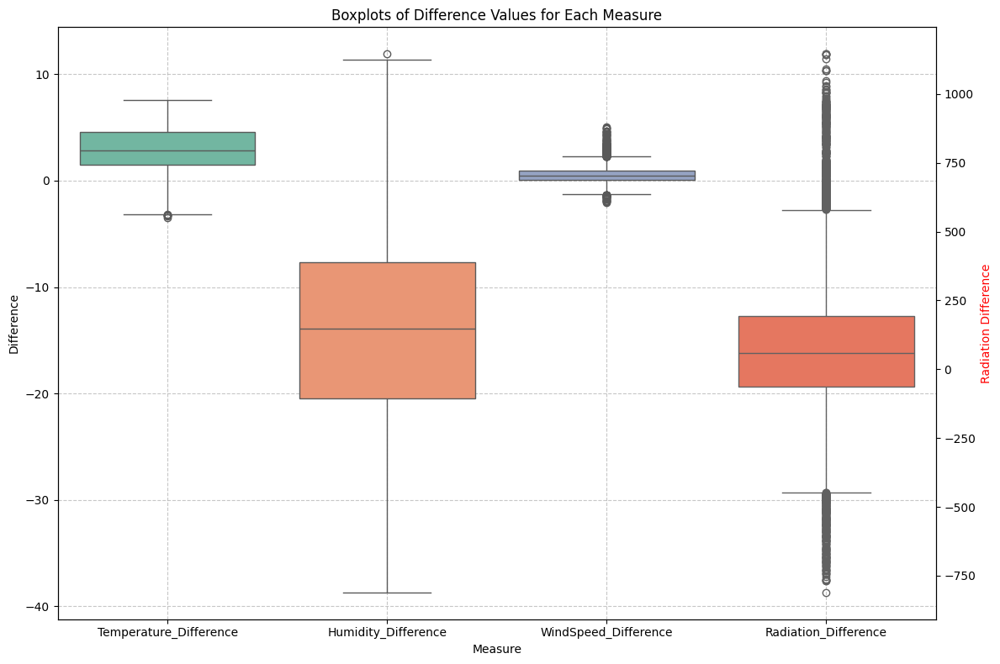

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_measure_boxplots(Int_df):
    # Calculate differences for each measure
    Int_df = Int_df[Int_df['time_difference'] < 150].copy()

    Int_df['Temperature_Difference'] = Int_df['Nearest_Wst_Temperature_C'] - Int_df['AirTemperature']
    Int_df['Humidity_Difference'] = Int_df['Nearest_Wst_Relativehumidity_p'] - Int_df['Humidity']
    Int_df['Radiation_Difference'] = Int_df['Nearest_Wst_Solar_radiation_Wm'] - Int_df['Radiation']
    Int_df['WindSpeed_Difference'] = Int_df['Nearest_Wst_Windspeed_ms'] - Int_df['WindSpeed']
    
    # Melt the dataframe to long format for easier plotting with Seaborn
    df_melted = Int_df.melt(id_vars=['run_number'], 
                            value_vars=['Temperature_Difference', 'Humidity_Difference', 'WindSpeed_Difference'], 
                            var_name='Measure', 
                            value_name='Difference')
    
    # Create a figure with two y-axes
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Plot boxplots for Temperature, Humidity, and WindSpeed on the primary y-axis
    sns.boxplot(x='Measure', y='Difference', data=df_melted, palette='Set2', ax=ax1)
    ax1.set_title('Boxplots of Difference Values for Each Measure')
    ax1.set_xlabel('Measure')
    ax1.set_ylabel('Difference')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Create a secondary y-axis for Radiation
    ax2 = ax1.twinx()
    
    # Melt the dataframe to long format for Radiation only
    df_radiation = Int_df[['run_number', 'Radiation_Difference']].copy()
    df_radiation_melted = df_radiation.melt(id_vars=['run_number'], 
                                            value_vars=['Radiation_Difference'], 
                                            var_name='Measure', 
                                            value_name='Difference')
    
    # Plot boxplots for Radiation on the secondary y-axis
    sns.boxplot(x='Measure', y='Difference', data=df_radiation_melted, palette='Reds', ax=ax2)
    ax2.set_ylabel('Radiation Difference', color='red')
    
    # Customize the plot
    ax1.set_xlabel('Measure')
    ax1.set_ylabel('Difference')
    ax2.set_ylabel('Radiation Difference', color='red')
    
    # Show plot
    plt.tight_layout()
    plt.show()

# Usage
plot_measure_boxplots(Int_df)


## With Participants Data

In [ ]:
# Import Cozie dataframe with weatherdata

participant_data_local_df = pd.read_csv(r'C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\src\cozieMeasureDf.csv', parse_dates=['index_time'])

# Convert datetime column to 'Asia/Singapore' timezone using tz_convert
participant_data_local_df['index_time'] = pd.to_datetime(participant_data_local_df['index_time'], format='mixed')
participant_data_local_df['index_time'] = participant_data_local_df['index_time'].dt.tz_convert('Asia/Singapore')

display(participant_data_local_df.head(5))

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

participant = 'esse13'

# Define the color mapping for the q_thermal_sensation values
color_map = {
    'hot': 'red',
    'neutral': 'gray',
    'slightly warm': 'orange',
    'slightly cool': 'cyan',
    'cool': 'blue'
}

# Filter the dataframe
filtered_df = participant_data_local_df[
    (participant_data_local_df['id_participant'] == participant) & 
    (participant_data_local_df['AirTemperature_time_difference'] < 300)
]

# Extract the day from the 'index_time' column
filtered_df['day'] = filtered_df['index_time'].dt.floor('D')

# Get the unique days
unique_days = filtered_df['day'].unique()

# Initialize counters for total data points
total_air_temperature = 0
total_humidity = 0
total_radiation = 0
total_windspeed = 0

# Initialize counters for Outdoor and non-Outdoor data points
total_outdoor_points = 0
total_non_outdoor_points = 0

# Loop through each unique day and create a plot
for day in unique_days:
    daily_data = filtered_df[filtered_df['day'] == day]
    
    # Filter for "Outdoor" and "Non-Outdoor" locations
    outdoor_data = daily_data[daily_data['q_general_location_envi'] == 'Outdoor']
    non_outdoor_data = daily_data[(daily_data['q_general_location_envi'] == 'Indoor') | 
                                    (daily_data['q_general_location_envi'] == 'Semi-Outdoor')]

    # Count data points
    total_outdoor_points += len(outdoor_data)
    total_non_outdoor_points += len(non_outdoor_data)

    fig, ax1 = plt.subplots(figsize=(14, 5))

    # Plot Air Temperature on the primary y-axis
    line1, = ax1.plot(daily_data['index_time'], daily_data['AirTemperature'], label='Air Temperature', color='blue')
    ax1.set_xlabel('Index Time')
    ax1.set_ylabel('Air Temperature (°C)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_ylim(22, 42)  # Adjust y-axis limits for Air Temperature

    # Create a second y-axis for Humidity
    ax2 = ax1.twinx()
    line2, = ax2.plot(daily_data['index_time'], daily_data['Humidity'], label='Humidity', color='green')
    ax2.set_ylabel('Humidity (%)', color='green')
    ax2.tick_params(axis='y', labelcolor='green')
    ax2.set_ylim(0, 100)

    # Create a third y-axis for Radiation
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))  # Offset the third axis to the right
    line3, = ax3.plot(daily_data['index_time'], daily_data['Radiation'], label='Radiation', color='red')
    ax3.set_ylabel('Radiation (W/m²)', color='red')
    ax3.tick_params(axis='y', labelcolor='red')
    ax3.set_ylim(0, 1200)

    # Create a fourth y-axis for Wind Speed
    ax4 = ax1.twinx()
    ax4.spines['right'].set_position(('outward', 120))  # Offset the fourth axis further to the right
    line4, = ax4.plot(daily_data['index_time'], daily_data['WindSpeed'], label='Wind Speed', color='purple')
    ax4.set_ylabel('Wind Speed (m/s)', color='purple')
    ax4.tick_params(axis='y', labelcolor='purple')
    ax4.set_ylim(0, daily_data['WindSpeed'].max() + 5)  # Adjust y-axis limits

    # Plot the q_thermal_sensation points for "Outdoor" data at fixed temperature value of 40
    fixed_temperature = 40
    scatter_handles = []
    for sensation, color in color_map.items():
        sensation_data = outdoor_data[outdoor_data['q_comfort_sensation'] == sensation]
        scatter_handle = ax1.scatter(sensation_data['index_time'], [fixed_temperature] * len(sensation_data), 
                                     color=color, label=sensation, marker='o', alpha=1)  # Plot at fixed temperature with black outline
        scatter_handles.append(scatter_handle)

    # Plot the q_thermal_sensation points for non-"Outdoor" data with black outline
    for sensation, color in color_map.items():
        sensation_data = non_outdoor_data[non_outdoor_data['q_comfort_sensation'] == sensation]
        ax1.scatter(sensation_data['index_time'], [fixed_temperature] * len(sensation_data), 
                    edgecolor='black', linewidth=2, color=color, label=f'{sensation} (Non-Outdoor)', marker='o', alpha=0.6)

    # Add a title and grid
    plt.title(f'Environmental Data over Time for Participant {participant} on {day.date()}')
    ax1.grid(True)

    # Add legend combining all handles
    handles, labels = [], []
    for handle, label in zip([line1, line2, line3, line4] + scatter_handles, 
                             ['Air Temperature', 'Humidity', 'Radiation', 'Wind Speed'] + list(color_map.keys())):
        handles.append(handle)
        labels.append(label)
    
    ax1.legend(handles=handles, labels=labels, loc='center left', frameon=False, bbox_to_anchor=(1.35, 0.9))

    # Show the plot
    fig.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

    # Update total counts
    total_air_temperature += daily_data['AirTemperature'].notna().sum()
    total_humidity += daily_data['Humidity'].notna().sum()
    total_radiation += daily_data['Radiation'].notna().sum()
    total_windspeed += daily_data['WindSpeed'].notna().sum()

# Print total counts
print(f"Total data points for Air Temperature: {total_air_temperature}")
print(f"Total data points for Humidity: {total_humidity}")
print(f"Total data points for Radiation: {total_radiation}")
print(f"Total data points for Wind Speed: {total_windspeed}")
print(f"Total Outdoor data points: {total_outdoor_points}")
print(f"Total Non-Outdoor data points: {total_non_outdoor_points}")
print(f"Total combined data points: {total_outdoor_points + total_non_outdoor_points}")
